# <span style="color:red"> Main Dataframe - Initial EDA </span>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)
import pickle
import os

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import textacy
import re
import nltk
import gensim

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# NLP Using a count vectorizer.
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.feature_extraction import DictVectorizer

from collections import Counter

plt.style.use('ggplot')

# extend limit of number of rows and columns to display in cell
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100


Bad key "text.kerning_factor" on line 4 in
/Users/Steven/opt/anaconda3/envs/textacy/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
in_full_path = '../../../../Documents/murakami/pkl3/df_all_v01.pkl'
# read back pickle
with open (in_full_path, 'rb') as fp:
    df = pickle.load(fp)

### Basic dataframe checks

In [3]:
df.head(3)

,book_chunk_no,number,title,text,fstop_indices,split_indices,chunks,translator,book_title,parsed,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
0,0,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",IT WAS A short one-paragraph item in the morni...,Alfred Birnbaum,A Wild Sheep Chase,"(IT, WAS, A, short, one, -, paragraph, item, i...",15,174,742,240,116,33,128,17,0,944,15.889831,184.322034,786.016949,254.237288,122.881356,34.957627,135.593220,18.008475,-0.4798,0.075,0.862,0.064,18.0,20.0,31.0,9.0,2.0,33.0,51.0,19.0,6.0,3.0,5.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,19.067797,21.186441,32.838983,9.533898,2.118644,34.957627,54.025424,20.127119,6.355932,3.177966,5.296610,5.296610,3.177966,2.118644,0.000000,0.0,0.0,0.0
1,1,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",I got off near the end of the line. The map p...,Alfred Birnbaum,A Wild Sheep Chase,"( , I, got, off, near, the, end, of, the, line...",15,176,734,229,118,29,132,9,0,935,16.042781,188.235294,785.026738,244.919786,126.203209,31.016043,141.176471,9.625668,-0.7902,0.079,0.891,0.030,17.0,22.0,25.0,13.0,5.0,29.0,42.0,22.0,5.0,2.0,12.0,12.0,0.0,0.0,1.0,0.0,0.0,0.0,18.181818,23.529412,26.737968,13.903743,5.347594,31.016043,44.919786,23.529412,5.347594,2.139037,12.834225,12.834225,0.000000,0.000000,1.069519,0.0,0.0,0.0
2,2,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",There was a small coffee shop near the univer...,Alfred Birnbaum,A Wild Sheep Chase,"( , There, was, a, small, coffee, shop, near, ...",13,195,834,250,119,29,150,9,0,1057,12.298959,184.484390,789.025544,236.518448,112.582781,27.436140,141.911069,8.514664,0.4215,0.066,0.840,0.094,18.0,26.0,28.0,14.0,1.0,35.0,38.0,19.0,6.0,6.0,11.0,11.0,4.0,13.0,1.0,0.0,0.0,0.0,17.029328,24.597919,26.490066,13.245033,0.946074,33.112583,35.950804,17.975402,5.676443,5.676443,10.406812,10.406812,3.784295,12.298959,0.946074,0.0,0.0,0.0


In [4]:
df.describe()

,book_chunk_no,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
count,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000
mean,390.080145,17.587283,188.774224,763.404911,238.439749,117.092899,25.499714,151.306301,9.582524,0.932991,983.511898,17.911142,191.927273,776.160639,242.429032,119.136365,25.931108,153.829455,9.743805,0.248507,0.062028,0.853876,0.084093,23.467923,31.420522,24.121074,11.486769,1.658481,38.119741,30.984771,18.715781,6.574148,3.770607,13.742623,10.343804,6.436703,5.078051,0.644965,0.832477,0.007805,0.066629,23.870148,31.949506,24.517373,11.673117,1.688423,38.811982,31.490449,19.022737,6.677130,3.830542,13.975678,10.518354,6.547102,5.175078,0.660843,0.848447,0.007995,0.067345
std,290.454383,5.497926,15.283910,48.874787,16.434505,9.189018,6.712620,18.492924,4.541454,0.773516,58.368698,5.605503,10.467614,16.297962,8.212793,7.544030,6.654638,16.412741,4.588366,0.743584,0.044257,0.060066,0.046115,8.861933,7.184359,5.479606,3.997675,1.727169,13.150758,7.913046,4.647938,2.547357,2.138065,4.750677,3.983665,3.209913,4.465702,0.523416,1.194091,0.110974,0.394816,8.933648,7.085929,5.350323,3.986003,1.764603,13.375612,7.757191,4.565127,2.547323,2.155805,4.777137,4.011674,3.256687,4.562235,0.538344,1.221777,0.115033,0.399193
min,0.000000,4.000000,76.000000,415.000000,131.000000,59.000000,5.000000,35.000000,0.000000,0.000000,519.000000,4.545455,76.923077,716.402116,194.532072,59.716599,4.821601,35.425101,0.000000,-0.997600,0.000000,0.612000,0.000000,0.000000,6.000000,1.000000,1.000000,0.000000,13.000000,7.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.072874,1.051525,0.960615,0.000000,12.727273,7.616975,0.000000,0.000000,0.000000,1.027749,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,164.000000,13.000000,180.000000,735.000000,229.000000,111.000000,21.000000,140.000000,6.000000,0.000000,952.000000,13.673655,185.684647,765.182186,237.029502,114.427861,21.276596,143.513203,6.437768,-0.577500,0.030000,0.817000,0.050000,17.000000,26.000000,20.000000,9.000000,0.000000,28.000000,25.000000,16.000000,5.000000,2.000000,10.000000,8.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,17.463235,26.939655,20.811655,8.917197,0.000000,28.340081,26.052104,15.957447,4.990020,2.096436,10.582011,7.782101,4.110997,1.968504,0.000000,0.000000,0.000000,0.000000
50%,332.000000,17.000000,189.000000,762.000000,238.000000,117.000000,25.000000,152.000000,9.000000,1.000000,982.000000,17.441860,192.389006,777.120316,242.393509,119.453925,25.502318,154.618474,9.054326,0.613600,0

In [9]:
df.book_title.unique()

array(['A Wild Sheep Chase', 'Kafka On The Shore',
       'Colorless Tsukuru Tazaki', 'The Elephant Vanishes',
       'The Wind Up Bird Chronicle', 'Norwegian Wood',
       'Dance Dance Dance'], dtype=object)

In [18]:
df[df.book_title == 'Dance Dance Dance'].tail(30)

,book_chunk_no,number,title,text,fstop_indices,split_indices,chunks,translator,book_title,parsed,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
4927,620,43,43,"\n WHEN I GOT back to the Dolphin Hotel, thre...","[95, 179, 209, 240, 257, 298, 421, 552, 599, 6...","[960, 1981, 2966, 3958, 4953, 5981, 6975, 7983...",How long ago was that? I’d forgotten about Yu...,Alfred Birnbaum,Dance Dance Dance,"( , How, long, ago, was, that, ?, I, ’d, forgo...",27,190,738,228,117,26,159,4,0,955,28.272251,198.952880,772.774869,238.743455,122.513089,27.225131,166.492147,4.188482,-0.9265,0.140,0.801,0.058,26.0,36.0,20.0,5.0,6.0,38.0,27.0,21.0,5.0,1.0,13.0,15.0,10.0,4.0,1.0,1.0,0.0,0.0,27.225131,37.696335,20.942408,5.235602,6.282723,39.790576,28.272251,21.989529,5.235602,1.047120,13.612565,15.706806,10.471204,4.188482,1.047120,1.047120,0.0,0.0
4928,621,43,43,"\n WHEN I GOT back to the Dolphin Hotel, thre...","[95, 179, 209, 240, 257, 298, 421, 552, 599, 6...","[960, 1981, 2966, 3958, 4953, 5981, 6975, 7983...","Show your face, please, tie me down somewhere...",Alfred Birnbaum,Dance Dance Dance,"( , Show, your, face, ,, please, ,, tie, me, d...",24,188,758,236,133,25,154,13,0,967,24.819028,194.415719,783.867632,244.053775,137.538780,25.853154,159.255429,13.443640,0.9226,0.027,0.862,0.111,18.0,31.0,29.0,11.0,3.0,30.0,36.0,17.0,6.0,2.0,11.0,13.0,5.0,5.0,1.0,1.0,0.0,0.0,18.614271,32.057911,29.989659,11.375388,3.102378,31.023785,37.228542,17.580145,6.204757,2.068252,11.375388,13.443640,5.170631,5.170631,1.034126,1.034126,0.0,0.0
4929,622,43,43,"\n WHEN I GOT back to the Dolphin Hotel, thre...","[95, 179, 209, 240, 257, 298, 421, 552, 599, 6...","[960, 1981, 2966, 3958, 4953, 5981, 6975, 7983...","Untold others stayed there, stepped in the gr...",Alfred Birnbaum,Dance Dance Dance,"( , Untold, others, stayed, there, ,, stepped,...",19,181,757,228,122,24,147,8,0,971,19.567456,186.405767,779.608651,234.809475,125.643666,24.716787,151.390319,8.238929,-0.3919,0.033,0.949,0.018,15.0,25.0,31.0,11.0,1.0,40.0,40.0,20.0,5.0,1.0,11.0,10.0,3.0,8.0,1.0,0.0,0.0,0.0,15.447992,25.746653,31.925850,11.328527,1.029866,41.194645,41.194645,20.597322,5.149331,1.029866,11.328527,10.298661,3.089598,8.238929,1.029866,0.000000,0.0,0.0
4930,623,43,43,"\n WHEN I GOT back to the Dolphin Hotel, thre...","[95, 179, 209, 240, 257, 298, 421, 552, 599, 6...","[960, 1981, 2966, 3958, 4953, 5981, 6975, 7983...","I turned on the TV and watched baseball, with...",Alfred Birnbaum,Dance Dance Dance,"( , I, turned, on, the, TV, and, watched, base...",25,184,757,233,123,26,144,6,0,992,25.201613,185.483871,763.104839,234.879032,123.991935,26.209677,145.161290,6.048387,-0.5918,0.062,0.897,0.041,26.0,38.0,14.0,11.0,2.0,57.0,25.0,15.0,4.0,1.0,23.0,10.0,7.0,5.0,1.0,3.0,0.0,0.0,26.209677,38.306452,14.112903,11.088710,2.016129,57.459677,25.201613,15.120968,4.032258,1.008065,23.185484,10.080645,7.056452,5.040323,1.008065,3.024194,0.0,0.0
4931,624,43,43,"\n WHEN I GOT back to the Dolphin Hotel, thre...","[95, 179, 209, 240, 257, 298, 421, 552, 599, 6...","[960, 1981, 2966, 3958, 4953, 5981, 6975, 7983...",“I’ve got to see you or I can’t talk. I’ve be...,Alfred Birnbaum,Dance Dance Dance,"( , “, I, ’ve, got, to, see, you, or, I, ca, n...",27,191,736,241,113,30,157,16,0

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5253 entries, 0 to 5252
Data columns (total 68 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   book_chunk_no              5253 non-null   int64  
 1   number                     5253 non-null   object 
 2   title                      5253 non-null   object 
 3   text                       5253 non-null   object 
 4   fstop_indices              5253 non-null   object 
 5   split_indices              5253 non-null   object 
 6   chunks                     5253 non-null   object 
 7   translator                 5253 non-null   object 
 8   book_title                 5253 non-null   object 
 9   parsed                     5253 non-null   object 
 10  n_sents                    5253 non-null   int64  
 11  n_words                    5253 non-null   int64  
 12  n_chars                    5253 non-null   int64  
 13  n_syllables                5253 non-null   int64


#### The datatypes look correct

In [4]:
df.describe(exclude=None)

,book_chunk_no,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
count,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000
mean,390.080145,17.587283,188.774224,763.404911,238.439749,117.092899,25.499714,151.306301,9.582524,0.932991,983.511898,17.911142,191.927273,776.160639,242.429032,119.136365,25.931108,153.829455,9.743805,0.248507,0.062028,0.853876,0.084093,23.467923,31.420522,24.121074,11.486769,1.658481,38.119741,30.984771,18.715781,6.574148,3.770607,13.742623,10.343804,6.436703,5.078051,0.644965,0.832477,0.007805,0.066629,23.870148,31.949506,24.517373,11.673117,1.688423,38.811982,31.490449,19.022737,6.677130,3.830542,13.975678,10.518354,6.547102,5.175078,0.660843,0.848447,0.007995,0.067345
std,290.454383,5.497926,15.283910,48.874787,16.434505,9.189018,6.712620,18.492924,4.541454,0.773516,58.368698,5.605503,10.467614,16.297962,8.212793,7.544030,6.654638,16.412741,4.588366,0.743584,0.044257,0.060066,0.046115,8.861933,7.184359,5.479606,3.997675,1.727169,13.150758,7.913046,4.647938,2.547357,2.138065,4.750677,3.983665,3.209913,4.465702,0.523416,1.194091,0.110974,0.394816,8.933648,7.085929,5.350323,3.986003,1.764603,13.375612,7.757191,4.565127,2.547323,2.155805,4.777137,4.011674,3.256687,4.562235,0.538344,1.221777,0.115033,0.399193
min,0.000000,4.000000,76.000000,415.000000,131.000000,59.000000,5.000000,35.000000,0.000000,0.000000,519.000000,4.545455,76.923077,716.402116,194.532072,59.716599,4.821601,35.425101,0.000000,-0.997600,0.000000,0.612000,0.000000,0.000000,6.000000,1.000000,1.000000,0.000000,13.000000,7.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.072874,1.051525,0.960615,0.000000,12.727273,7.616975,0.000000,0.000000,0.000000,1.027749,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,164.000000,13.000000,180.000000,735.000000,229.000000,111.000000,21.000000,140.000000,6.000000,0.000000,952.000000,13.673655,185.684647,765.182186,237.029502,114.427861,21.276596,143.513203,6.437768,-0.577500,0.030000,0.817000,0.050000,17.000000,26.000000,20.000000,9.000000,0.000000,28.000000,25.000000,16.000000,5.000000,2.000000,10.000000,8.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,17.463235,26.939655,20.811655,8.917197,0.000000,28.340081,26.052104,15.957447,4.990020,2.096436,10.582011,7.782101,4.110997,1.968504,0.000000,0.000000,0.000000,0.000000
50%,332.000000,17.000000,189.000000,762.000000,238.000000,117.000000,25.000000,152.000000,9.000000,1.000000,982.000000,17.441860,192.389006,777.120316,242.393509,119.453925,25.502318,154.618474,9.054326,0.613600,0

#### The values in the describe output look reasonable

Note some of the POS counts are mostly zero and may be removed later

### Visualise how the data is split between translators, books etc.

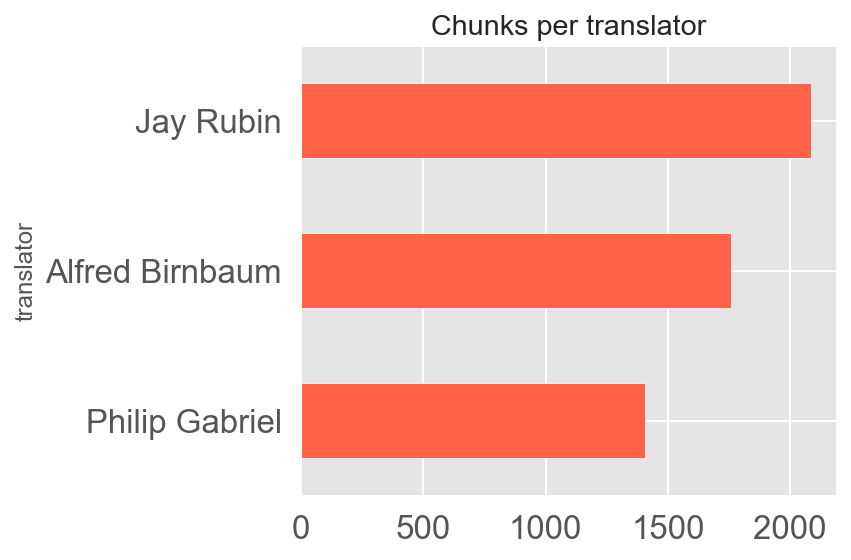

In [5]:
sns.set_palette(['tomato', 'white', 'darkred'])
df.groupby('translator')['chunks'].count().sort_values().plot(kind='barh', title='Chunks per translator')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_translator_01.png')
plt.show()

In [6]:
df.groupby('translator').count()[['chunks']]

,chunks
translator,
Alfred Birnbaum,1759
Jay Rubin,2087
Philip Gabriel,1407


* #### We have the most chunks for Jay Rubin translations and the least for Philip Gabriel
* #### Overall the dataset is relatively balanced for each target value ie. translator

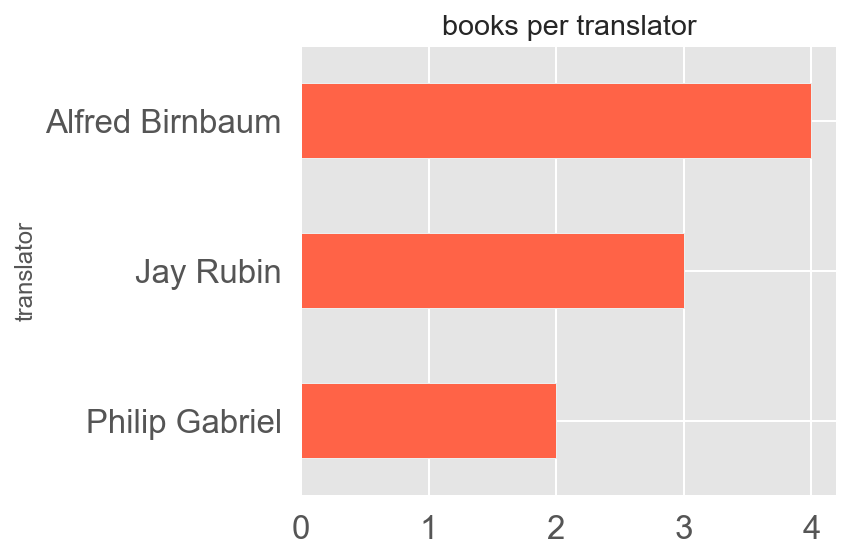

In [7]:
df.groupby('translator')['book_title'].nunique().sort_values().plot(kind='barh', title='books per translator')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_translator_no_ws_01.png')
plt.show()

#### Despite not having the most chunks we have most books for Alfred Birnbaum. This is due to only a few chapters being available for one of his books

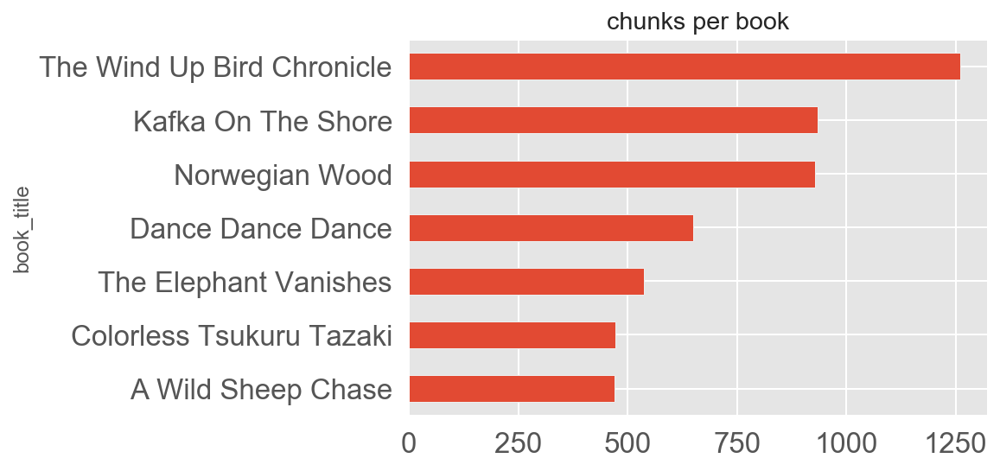

In [11]:
df.groupby('book_title')['chunks'].count().sort_values().plot(kind='barh', title='chunks per book')
plt.show()

In [8]:
chunks_per_book_t = df.groupby(['translator','book_title'])[['chunks']].count().reset_index()
chunks_per_book_t.set_index('book_title', inplace=True)

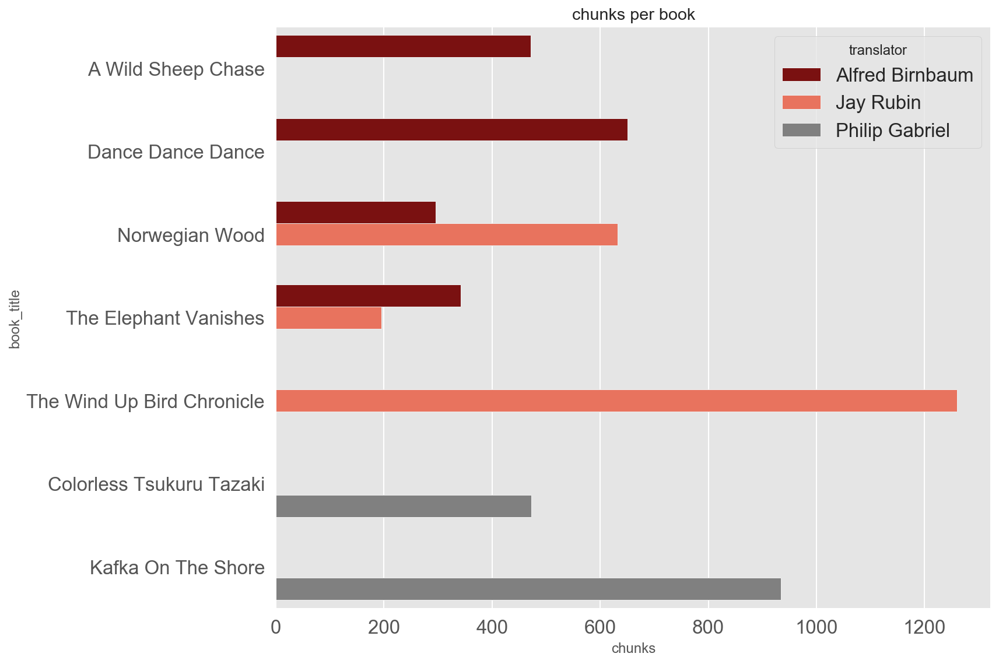

In [9]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.barplot(y = chunks_per_book_t.index, x='chunks', 
            hue='translator', data=chunks_per_book_t, orient='h')
plt.title('chunks per book')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_book_translator_01.png')
plt.show()

#### We can see that The Wind Up Bird Chronicle is the longest book and more than twice as long as the three shortest books

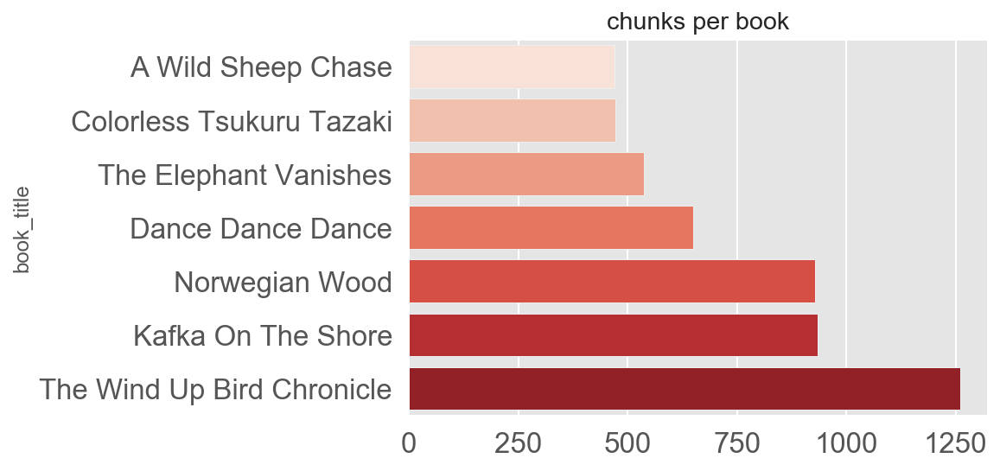

In [10]:
chunks_per_book = df.groupby('book_title')['chunks'].count().sort_values()
sns.barplot(y = chunks_per_book.index, x=chunks_per_book.values, orient = 'h', palette='Reds')
plt.title('chunks per book')
plt.show()

#### We should note that there are two versions of Norwegian wood so a single version is shorter than shown above

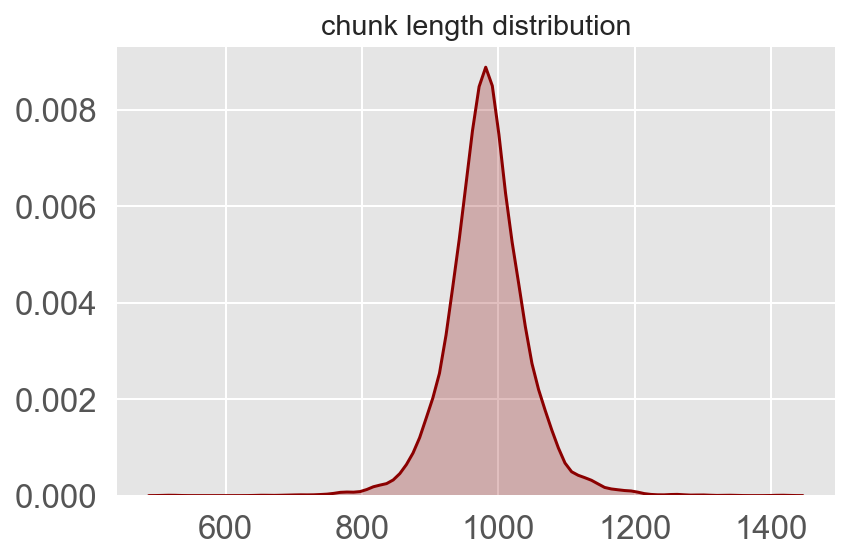

In [11]:
fig, ax = plt.subplots(figsize=(6, 4))
sns.kdeplot(df.chunk_length, shade=True, legend=False)
plt.title('chunk length distribution')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_length dist_01.png')
plt.show()

#### The chunk lengths are normally distributed around 1000 as expected

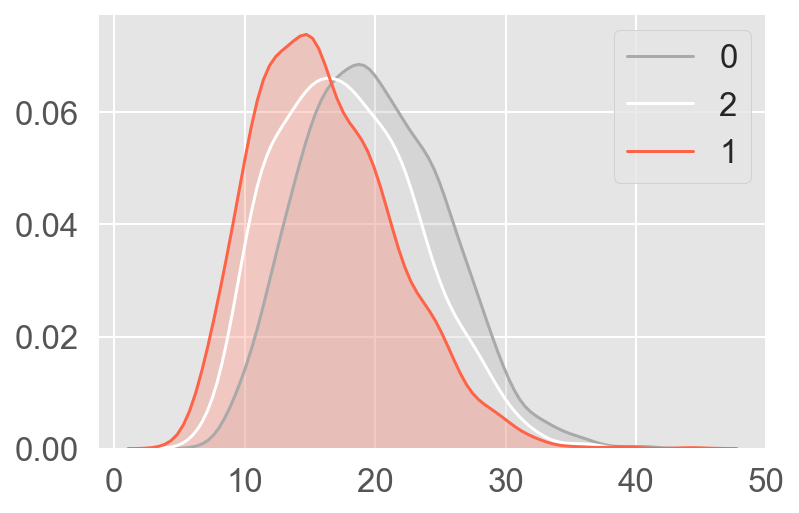

In [13]:
for t in df.trans_code.unique():
    sns.kdeplot(df[df.trans_code == t].n_sents_norm, label=t, shade=True)
plt.show()

#### We can see above that some of the features are distributed differently for each translator which is a positive sign that we may be able to use the features to distinguish between the translators

### Vader Analysis check
* We may not use the Vader sentiment analysis to distinguish between translators as the sentiment may be more likely to vary between novels rather than translators. As most novels only have one translator it may help us distinguish the books but we won't gain any insight into the translator styles

In [16]:
df_vader_summary = df.groupby(['book_title', 'translator']).mean()[['vader_neg', 'vader_neu', 'vader_pos']]
df_vader_summary

vader_neg  vader_neu  vader_pos
book_title                 translator                                      
A Wild Sheep Chase         Alfred Birnbaum   0.050673   0.884849   0.064484
Colorless Tsukuru Tazaki   Philip Gabriel    0.053884   0.845146   0.100956
Dance Dance Dance          Alfred Birnbaum   0.066423   0.844732   0.088838
Kafka On The Shore         Philip Gabriel    0.066258   0.840794   0.092978
Norwegian Wood             Alfred Birnbaum   0.057314   0.844270   0.098341
                           Jay Rubin         0.061810   0.838723   0.099448
The Elephant Vanishes      Alfred Birnbaum   0.056371   0.875380   0.068240
                           Jay Rubin         0.053123   0.872595   0.074272
The Wind Up Bird Chronicle Jay Rubin         0.068056   0.861113   0.070831

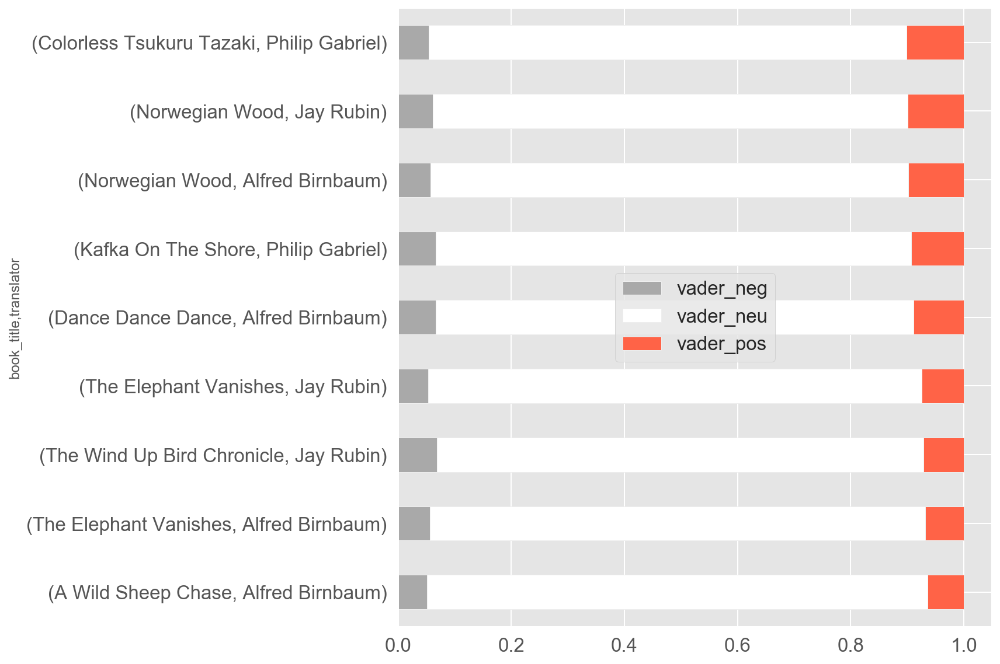

In [17]:
sns.set_palette(['darkgray', 'white', 'tomato'])
fig, ax = plt.subplots(figsize=(12, 8))
# df_vader_summary.sort_values('vader_pos').plot(kind='barh', stacked=True, colormap="coolwarm", ax=ax)
df_vader_summary.sort_values('vader_pos').plot(kind='barh', stacked=True, ax=ax)
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/vader_scores_01.png')
plt.show()

#### We can see that the sentiment varies a bit from book to book 
#### However for 'Norwegian Wood' each translated text has similar sentiment analysis
#### This helps confirm that the sentiment analysis is a better indicator of the book than the translator

### We can look at some of the predictor variable columns in pairplots

In [18]:
predictor_cols = [i for i in df.columns if i.endswith('_norm')]
len(predictor_cols)

26

In [20]:
pred_cols_1 = list(predictor_cols)[:5]
pred_cols_1.extend(['trans_code'])
pred_cols_2 = list(predictor_cols)[5:10]
pred_cols_2.extend(['trans_code'])
pred_cols_3 = list(predictor_cols)[10:15]
pred_cols_3.extend(['trans_code'])
pred_cols_4 = list(predictor_cols)[15:20]
pred_cols_4.extend(['trans_code'])
pred_cols_5 = list(predictor_cols)[20:]
pred_cols_5.extend(['trans_code'])

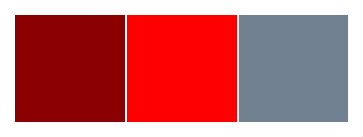

In [133]:
qualitative_colors = sns.color_palette(['darkred', 'red', 'slategray'])
sns.palplot(qualitative_colors)

In [131]:
import matplotlib.colors as mcolors

data = np.random.rand(10,10) * 2 - 1

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.binary(np.linspace(0., 1, 128))
colors2 = plt.cm.gist_heat_r(np.linspace(0, 1, 128))

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.binary(np.linspace(0., 1, 128))
colors2 = plt.cm.gist_heat_r(np.linspace(0, 1, 128))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)


In [ ]:
cm = LinearSegmentedColormap.from_list(
        cmap_name, colors, N=n_bin)

<Figure size 1152x1152 with 0 Axes>

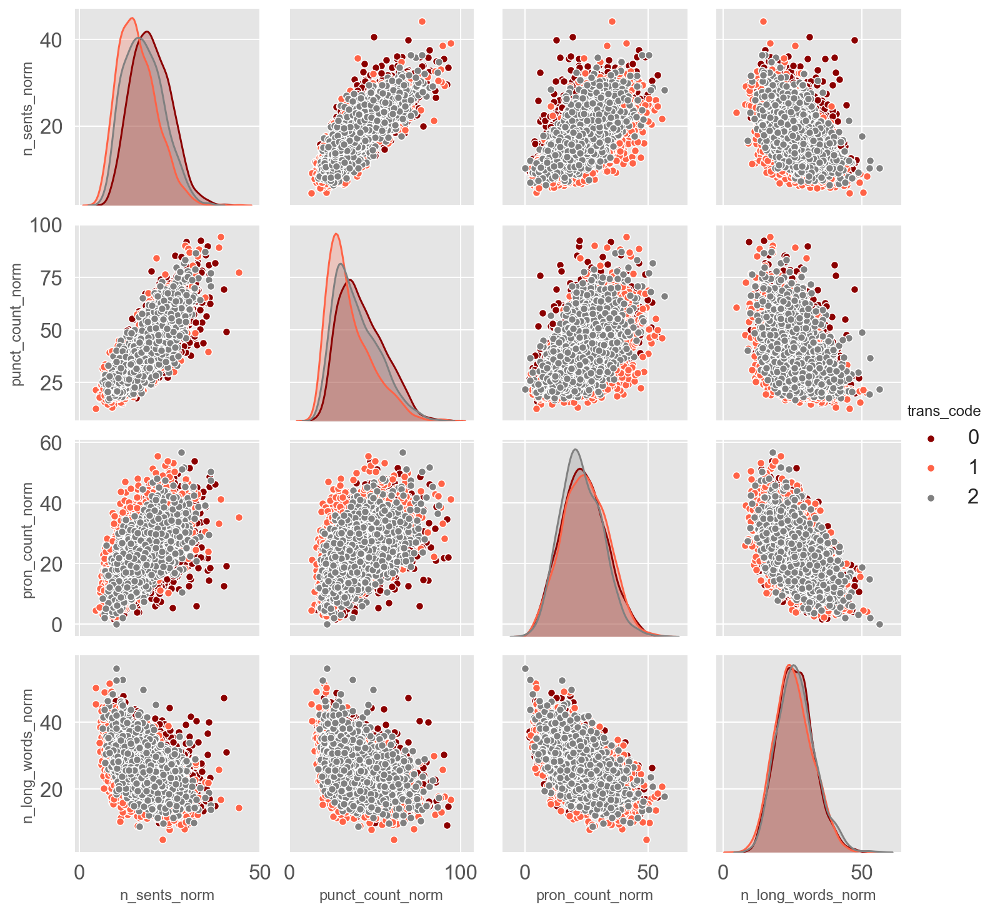

In [21]:
plt.figure(figsize=(16,16))
preds_sel = ['n_sents_norm', 'punct_count_norm', 'pron_count_norm', 'n_long_words_norm', 'trans_code']
# sns.set_palette("Reds", 6)
sns.set_palette(['darkred', 'tomato', 'gray'])
# sns.set_palette("Set1")
sns.pairplot(df[preds_sel], hue='trans_code')
plt.savefig('../../../../Documents/murakami/plots/pairplot_01.png')
plt.show()

<Figure size 1152x1152 with 0 Axes>

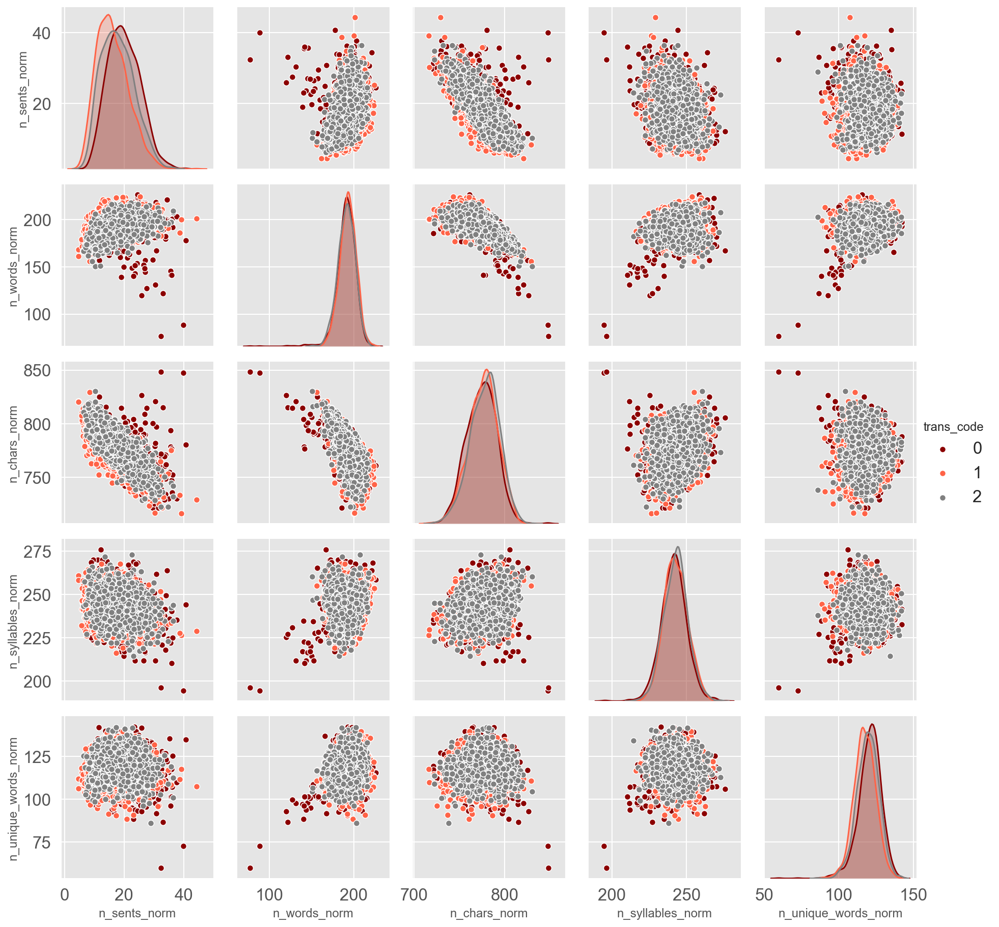

In [23]:
plt.figure(figsize=(16,16))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.pairplot(df[pred_cols_1], hue='trans_code')
plt.show()

<Figure size 1152x1152 with 0 Axes>

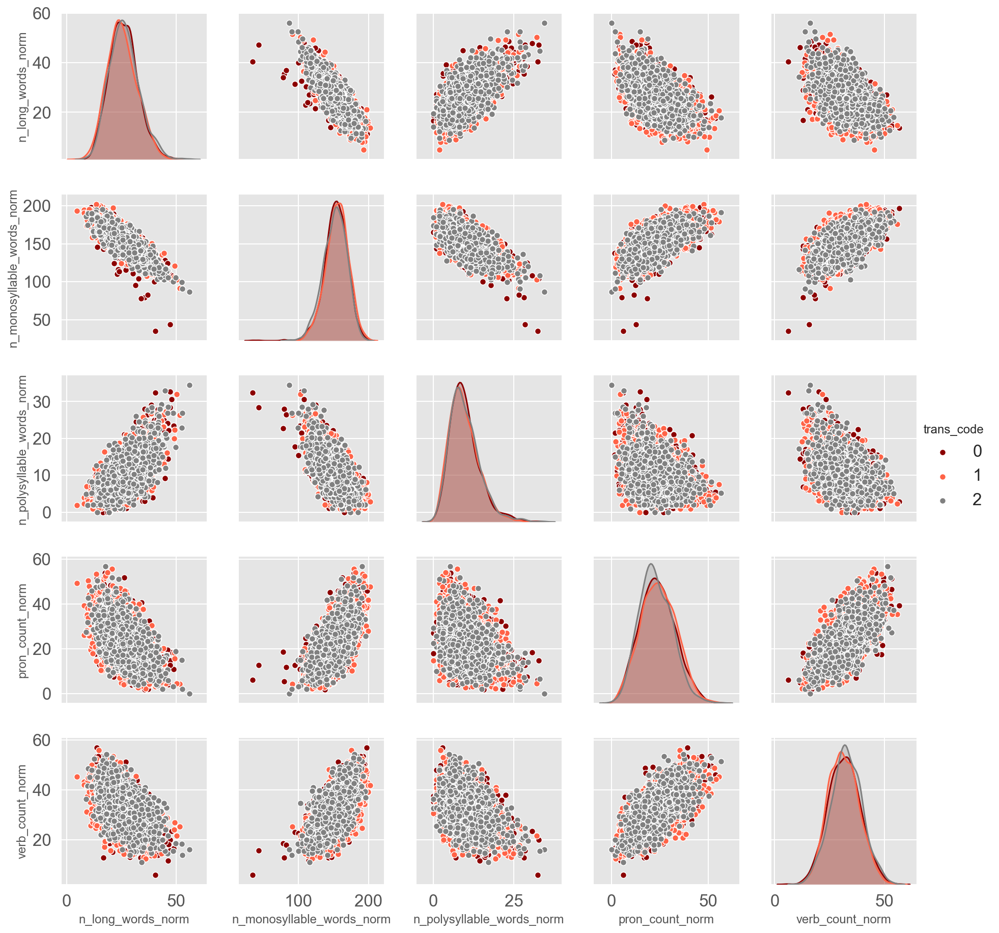

In [24]:
plt.figure(figsize=(16,16))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.pairplot(df[pred_cols_2], hue='trans_code')
plt.show()

<Figure size 1152x1152 with 0 Axes>

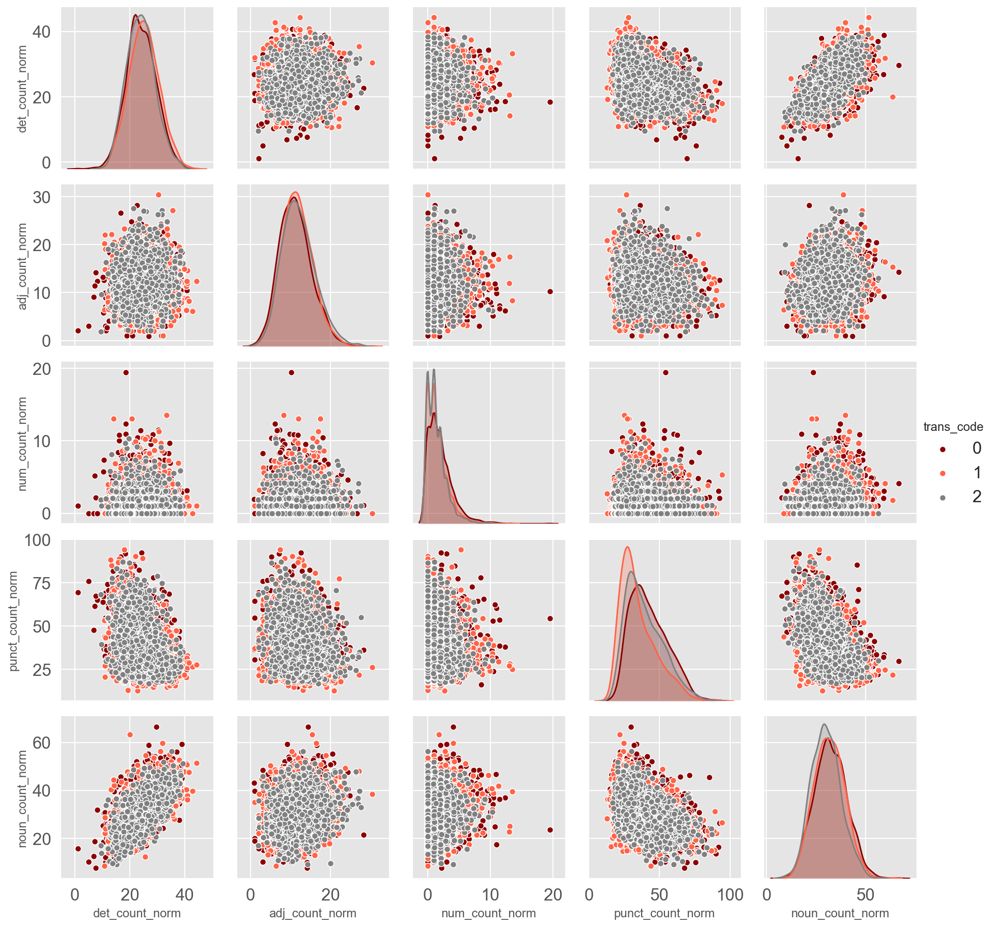

In [25]:
plt.figure(figsize=(16,16))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.pairplot(df[pred_cols_3], hue='trans_code')
plt.show()

<Figure size 1152x1152 with 0 Axes>

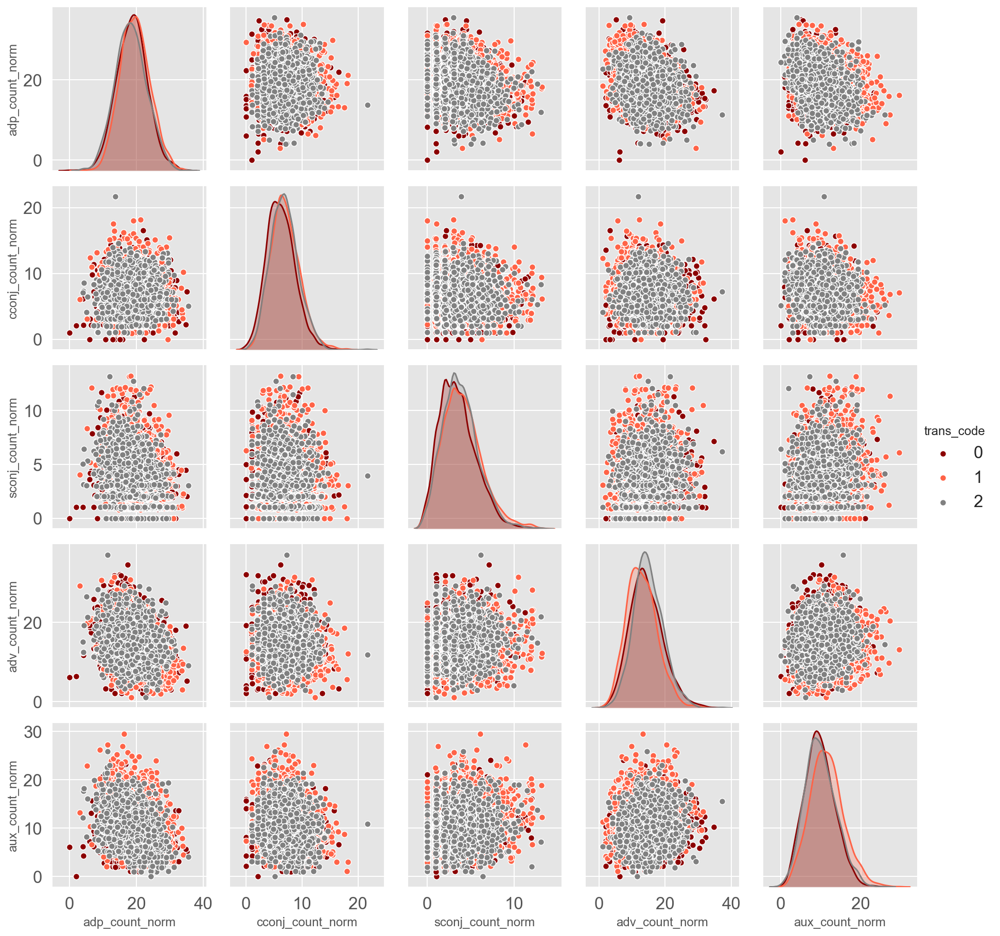

In [26]:
plt.figure(figsize=(16,16))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.pairplot(df[pred_cols_4], hue='trans_code')
plt.show()

<Figure size 1152x1152 with 0 Axes>

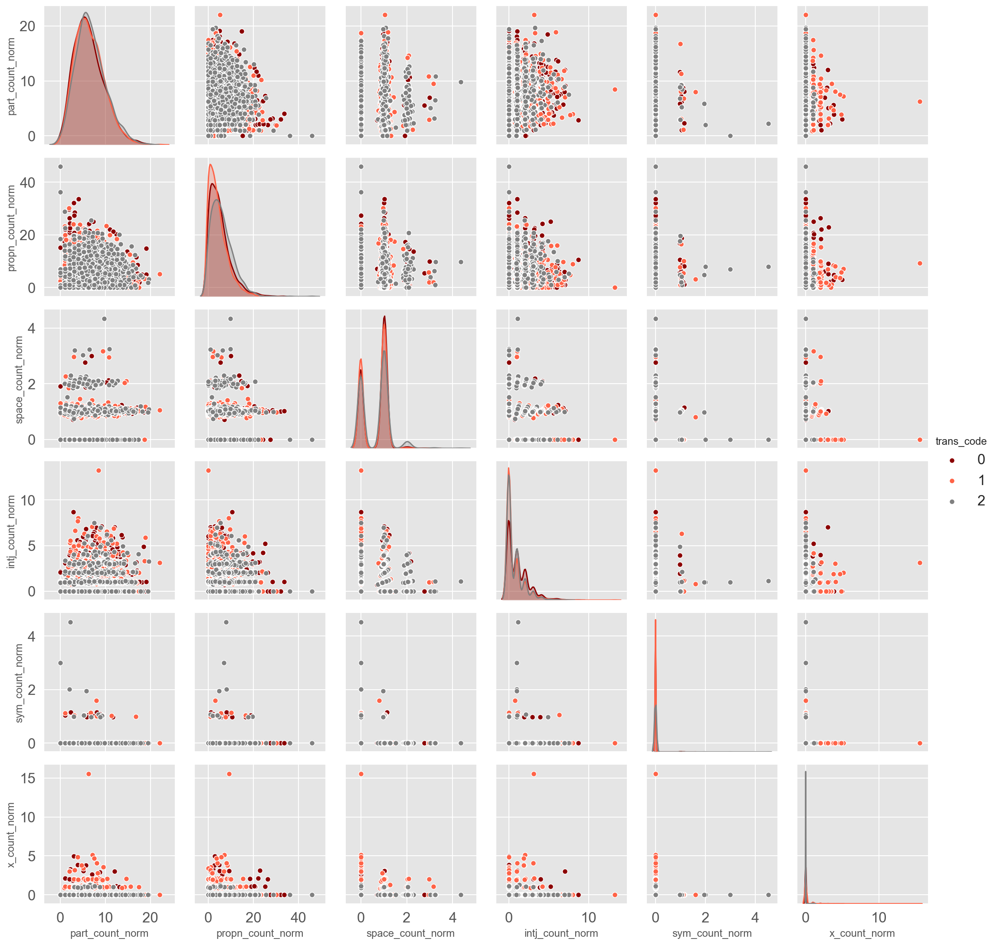

In [27]:
plt.figure(figsize=(16,16))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.pairplot(df[pred_cols_5], hue='trans_code')
plt.show()

### Comments on the pairplots

* sym_count_norm and x_count_norm are often 0. May drop these columns as predictors later
* space_count_norm column previously looked unusual but removing double spaces earlier has helped 
* many of the other variables are normally distributed, sometimes with a right skew
* often the density and crossplots for each translator overlap quite closely
* translator 0 (Birnbaum) at first glance looks to be the most distinguishable

### Word Clouds
* Nice visual but maybe less useful for analysis
* Showing six of the books
* Includes bi-grams
* Can see that main characters and fairly general words like hi, said, you etc.
* Highlights that we need to be careful using specific words or phrases to determine the translator

In [28]:
# Importing necessary libraries
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

In [29]:
text = " ".join(chunk for chunk in df.chunks.iloc[:-2])
print ("There are {} words in the combination of all chunks.".format(len(text)))

There are 5169639 words in the combination of all chunks.


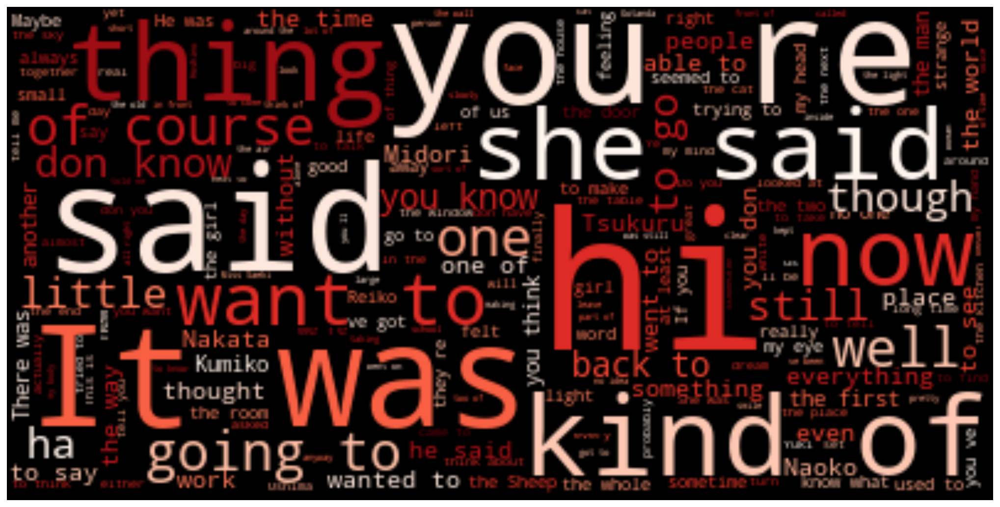

In [30]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["wa"])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='Reds').generate(text)

fig, ax = plt.subplots(figsize=(18, 10))
# Display the generated image:
# the matplotlib way:
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis("off")
plt.show()

In [31]:
book_texts = {}
for book in df.book_title.unique():
    book_texts[book] = " ".join(chunk for chunk in df.chunks[df.book_title == book])

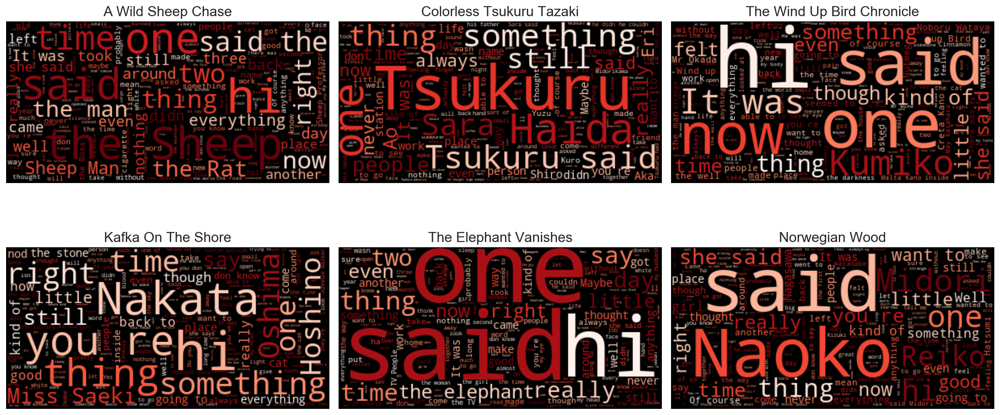

In [32]:
fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(16, 8), sharex=False, sharey=True)
    
for i, book in enumerate(book_texts):
    if i < 6:
        # Generate a word cloud image
        wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='Reds').generate(book_texts[book])
        ax[i%2, int(i/2)].imshow(wordcloud, interpolation='bilinear')
        ax[i%2, int(i/2)].axis("off")
        ax[i%2, int(i/2)].set_title(book, fontsize=16)

plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/wordclouds.png')
# plt.subplots_adjust(hspace=0.6)
plt.show()